In [36]:
import os
os.getcwd()
os.chdir('/home/a4ankan/aMAZON fINAL WORK/amazon fine food')
os.getcwd()

'/home/a4ankan/aMAZON fINAL WORK/amazon fine food'

In [37]:
%matplotlib inline
import warnings
warnings.filterwarnings("ignore")

import sqlite3
import pandas as pd
import numpy as np
import nltk
import string
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.feature_extraction.text import TfidfVectorizer

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics import confusion_matrix
from sklearn import metrics
from sklearn.metrics import roc_curve, auc
from nltk.stem.porter import PorterStemmer

import re
# Tutorial about Python regular expressions: https://pymotw.com/2/re/
import string
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from nltk.stem.wordnet import WordNetLemmatizer

from gensim.models import Word2Vec
from gensim.models import KeyedVectors
import pickle



# it connects my code with the sql database
con = sqlite3.connect('database.sqlite') 



#Writting a query; 'con' is the link
# Here, I am saying that 'slelct (*) from reviews which are not equal to 3'.
#Just take the reviews which are 1,2,4 or 5.



filtered_data = pd.read_sql_query(""" SELECT * FROM Reviews WHERE Score != 3 """, con) #filtering only positive and negative reviews i.e. 
# not taking into consideration those reviews with Score=3





# Give reviews with Score>3 a positive rating, and reviews with a score<3 a negative rating.
def partition(x):
    if x < 3:
        return -1
    return 1

#changing reviews with score less than 3 to be positive and vice-versa
actualScore = filtered_data['Score']
positiveNegative = actualScore.map(partition) 
filtered_data['Score'] = positiveNegative
filtered_data.sort_values('Time',inplace=True) 

print(filtered_data.shape) #The score coloumn becomesb positive / negative
filtered_data.head()

(525814, 10)


,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text
138706,150524,0006641040,ACITT7DI6IDDL,shari zychinski,0,0,1,939340800,EVERY book is educational,this witty little book makes my son laugh at l...
138683,150501,0006641040,AJ46FKXOVC7NR,Nicholas A Mesiano,2,2,1,940809600,This whole series is great way to spend time w...,I can remember seeing the show when it aired o...
417839,451856,B00004CXX9,AIUWLEQ1ADEG5,Elizabeth Medina,0,0,1,944092800,Entertainingl Funny!,Beetlejuice is a well written movie ..... ever...
417859,451878,B00004CXX9,A344SMIA5JECGM,Vincent P. Ross,1,2,1,944438400,A modern day fairy tale,"A twist of rumplestiskin captured on film, sta..."
212472,230285,B00004RYGX,A344SMIA5JECGM,Vincent P. Ross,1,2,1,944438400,A modern day fairy tale,"A twist of rumplestiskin captured on film, sta..."


In [38]:
#Sorting data according to ProductId in ascending order
sorted_data=filtered_data.sort_values('ProductId', axis=0, ascending=True, inplace=False, kind='quicksort', na_position='last')

In [39]:
#Deduplication of entries
final=sorted_data.drop_duplicates(subset={"UserId","ProfileName","Time","Text"}, keep='first', inplace=False)
final.shape

(364173, 10)

In [40]:
#Checking to see how much % of data still remains
(final['Id'].size*1.0)/(filtered_data['Id'].size*1.0)*100

69.25890143662969

In [41]:
display= pd.read_sql_query("""
SELECT *
FROM Reviews
WHERE Score != 3 AND Id=44737 OR Id=64422
ORDER BY ProductID
""", con)
display.sort_values('Time',inplace=True) 

display.head()

,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text
1,44737,B001EQ55RW,A2V0I904FH7ABY,Ram,3,2,4,1212883200,Pure cocoa taste with crunchy almonds inside,It was almost a 'love at first bite' - the per...
0,64422,B000MIDROQ,A161DK06JJMCYF,"J. E. Stephens ""Jeanne""",3,1,5,1224892800,Bought This for My Son at College,My son loves spaghetti so I didn't hesitate or...


In [42]:
final = final[final.HelpfulnessNumerator <= final.HelpfulnessDenominator]

In [43]:
#Before starting the next phase of preprocessing lets see the number of entries left
print(final.shape)

#How many positive and negative reviews are present in our dataset?
final['Score'].value_counts()

(364171, 10)


 1    307061
-1     57110
Name: Score, dtype: int64

In [44]:
import re
i=0;
for sent in final['Text'].values:
    if (len(re.findall('<.*?>', sent))):
        print(i)
        print(sent)
        break;
    i += 1;

1
Summary:  A young boy describes the usefulness of chicken soup with rice for each month of the year.<br /><br />Evaluation:  With Sendak's creative repetitious and rhythmic words, children will enjoy and learn to read the story of a boy who loves chicken soup with rice!  Through Sendak's catchy story, children will also learn the months of the year, as well as what seasons go with what month! They learn to identify ice-skating and snowmen in the winter; strong wind in March; birds and flowers in the spring; swimming and hot temperatures in the summer; and finally different holidays throughout the year. Such as Halloween in October, and Christmas in December.<br /><br />Sendak's simple three colored crayon-like drawings are a perfect addition to his educational and entertaining story.<br /><br />A great activity that you can do with this book is to have children draw their own illustrations for each month of the year.  Afterwards you can bind the pages together so the children can cre

In [45]:
stop = set(stopwords.words('english')) #set of stopwords
sno = nltk.stem.SnowballStemmer('english') #initialising the snowball stemmer

def cleanhtml(sentence): #function to clean the word of any html-tags
    cleanr = re.compile('<.*?>')
    cleantext = re.sub(cleanr, ' ', sentence)
    return cleantext
def cleanpunc(sentence): #function to clean the word of any punctuation or special characters
    cleaned = re.sub(r'[?|!|\'|"|#]',r'',sentence)
    cleaned = re.sub(r'[.|,|)|(|\|/]',r' ',cleaned)
    return  cleaned
print(stop)
print('************************************')
print(sno.stem('tasty'))

{'over', 'few', 'about', "that'll", 'am', "hadn't", 'yourselves', 'll', 'whom', 'doing', 'them', 'a', 'ain', 'for', 'any', 'we', 'are', 'because', "mustn't", 'been', 'should', 'mightn', 'hasn', 'between', 'such', "weren't", 'did', 'most', 'no', 'had', "wouldn't", 'own', 'too', 'there', 'then', 'out', 'when', 'of', 'each', "doesn't", 'down', 'ourselves', 'mustn', 'doesn', 'what', 'in', 'into', 'under', 'while', 'd', 'weren', 'shouldn', 'he', 'won', "should've", 'wasn', 'how', 'was', 'than', "you're", 'm', 'to', 're', 'why', 'an', "isn't", 'not', 'couldn', "you'd", 'yourself', 'their', 'both', 'very', 'having', "didn't", 'our', 'at', 'o', "you'll", 'against', 'yours', 'again', 'didn', 'before', 'here', 'his', 'were', 'be', 'haven', "couldn't", 'ma', 'up', 'some', 'me', 'all', 'do', 'now', 'theirs', "hasn't", 'has', 'with', 'those', 'on', "won't", 'which', "she's", 'until', 'does', 'isn', 'nor', 've', 'my', 'if', 'as', 'these', 'ours', 'is', "needn't", 'other', 'more', 'who', "it's", 'tha

In [46]:
#Code for implementing step-by-step the checks mentioned in the pre-processing phase


i=0
str1=' '
final_string=[]
all_positive_words=[] # store words from +ve reviews here
all_negative_words=[] # store words from -ve reviews here.
s=''
for sent in final['Text'].values:
    filtered_sentence=[]
    #print(sent);
    sent=cleanhtml(sent) # remove HTMl tags
    for w in sent.split():
        for cleaned_words in cleanpunc(w).split():
            if((cleaned_words.isalpha()) & (len(cleaned_words)>2)):    
                if(cleaned_words.lower() not in stop):
                    s=(sno.stem(cleaned_words.lower())).encode('utf8')
                    filtered_sentence.append(s)
                    if (final['Score'].values)[i] == 'positive': 
                        all_positive_words.append(s) #list of all words used to describe positive reviews
                    if(final['Score'].values)[i] == 'negative':
                        all_negative_words.append(s) #list of all words used to describe negative reviews reviews
                else:
                    continue
            else:
                continue 
    #print(filtered_sentence)
    str1 = b" ".join(filtered_sentence) #final string of cleaned words
    #print("***********************************************************************")
    
    final_string.append(str1)
    i+=1

In [47]:
final['CleanedText']=final_string #adding a column of CleanedText which displays the data after pre-processing of the review 
final['CleanedText']=final['CleanedText'].str.decode("utf-8")

In [48]:

# store final table into an SQlLite table for future.
conn = sqlite3.connect('final.sqlite')
c=conn.cursor()
conn.text_factory = str
final.to_sql('Reviews', conn,  schema=None, if_exists='replace', index=True, index_label=None, chunksize=None, dtype=None)


In [49]:
final.head(3) #below the processed review can be seen in the CleanedText Column 

,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text,CleanedText
138706,150524,0006641040,ACITT7DI6IDDL,shari zychinski,0,0,1,939340800,EVERY book is educational,this witty little book makes my son laugh at l...,witti littl book make son laugh loud recit car...
138705,150523,0006641040,A2P4F2UO0UMP8C,"Elizabeth A. Curry ""Lovely Librarian""",0,0,1,1096675200,MMMM chicken soup....,Summary: A young boy describes the usefulness...,young boy describ use chicken soup rice month ...
138699,150517,0006641040,ABW4IC5G5G8B5,kevin clark,0,0,1,1291075200,good for children,"Classic children's book, can't go wrong. I rea...",classic children book cant wrong read kid orde...


In [50]:
#Code for implementing step-by-step the checks mentioned in the pre-processing phase


i=0
str1=' '
final_string=[]
all_positive_words=[] # store words from +ve reviews here
all_negative_words=[] # store words from -ve reviews here.
s=''
for sent in final['Summary'].values:
    filtered_sentence=[]
    #print(sent);
    sent=cleanhtml(sent) # remove HTMl tags
    for w in sent.split():
        for cleaned_words in cleanpunc(w).split():
            if((cleaned_words.isalpha()) & (len(cleaned_words)>2)):    
                if(cleaned_words.lower() not in stop):
                    s=(sno.stem(cleaned_words.lower())).encode('utf8')
                    filtered_sentence.append(s)
                    if (final['Score'].values)[i] == 'positive': 
                        all_positive_words.append(s) #list of all words used to describe positive reviews
                    if(final['Score'].values)[i] == 'negative':
                        all_negative_words.append(s) #list of all words used to describe negative reviews reviews
                else:
                    continue
            else:
                continue 
    #print(filtered_sentence)
    str1 = b" ".join(filtered_sentence) #final string of cleaned words
    #print("***********************************************************************")
    
    final_string.append(str1)
    i+=1

In [51]:
final['Summary']=final_string #adding a column of CleanedText which displays the data after pre-processing of the review 
final['Summary']=final['Summary'].str.decode("utf-8")

Made 'New', which stores the values of all the reviews and the Summary coloumn

In [52]:
final['New'] = final['Summary'] + final['CleanedText']

Here, I have dropped some coloumns which we won't be requiring for this particular assignment....

In [53]:
final = final.drop(['HelpfulnessNumerator', 'HelpfulnessDenominator', 'Text'], axis = 1)
final.head(3)

,Id,ProductId,UserId,ProfileName,Score,Time,Summary,CleanedText,New
138706,150524,0006641040,ACITT7DI6IDDL,shari zychinski,1,939340800,everi book educ,witti littl book make son laugh loud recit car...,everi book educwitti littl book make son laugh...
138705,150523,0006641040,A2P4F2UO0UMP8C,"Elizabeth A. Curry ""Lovely Librarian""",1,1096675200,mmmm chicken soup,young boy describ use chicken soup rice month ...,mmmm chicken soupyoung boy describ use chicken...
138699,150517,0006641040,ABW4IC5G5G8B5,kevin clark,1,1291075200,good children,classic children book cant wrong read kid orde...,good childrenclassic children book cant wrong ...


In [54]:
final = final.sample(n = 100000, replace = True) # Sampling 100k rows 
final = pd.DataFrame(final)
final.head(5)

,Id,ProductId,UserId,ProfileName,Score,Time,Summary,CleanedText,New
41404,44999,B0029NTQ1K,AZPOFLFAWXON,Sleepy,1,1265587200,wonder bad breath,adopt neighborhood cat month ago nice horribl ...,wonder bad breathadopt neighborhood cat month ...
450405,486987,B000PDWBKO,A2E14J26DQZOAA,M. Connelly,1,1334880000,real deal,stuff real deal folk simpli cannot get closer ...,real dealstuff real deal folk simpli cannot ge...
214426,232399,B00437I580,A38HH2OJ5T4JZO,mixed-berry,-1,1299888000,happen mash potato,rememb betti crocker introduc line mash potato...,happen mash potatorememb betti crocker introdu...
319387,345753,B000ED9L9E,A35GBIY3OJ6V3F,Luis,1,1342915200,seen organ store decid tri,surpris hot cereal rock add splenda give extra...,seen organ store decid trisurpris hot cereal r...
205099,222190,B004Y8TY24,A3IWN2UY8QSSXC,S. Manning,1,1347494400,healthi natur immedi notic chang,adopt elder dog pound sent home food month wel...,healthi natur immedi notic changadopt elder do...


In [55]:
X = final['New']
X.head()

41404     wonder bad breathadopt neighborhood cat month ...
450405    real dealstuff real deal folk simpli cannot ge...
214426    happen mash potatorememb betti crocker introdu...
319387    seen organ store decid trisurpris hot cereal r...
205099    healthi natur immedi notic changadopt elder do...
Name: New, dtype: object

In [56]:
Y = final['Score']

Y.head()

41404     1
450405    1
214426   -1
319387    1
205099    1
Name: Score, dtype: int64

In [57]:
from sklearn.cross_validation import cross_val_score
from collections import Counter
from sklearn.metrics import accuracy_score
from sklearn import cross_validation
import warnings
warnings.filterwarnings("ignore")

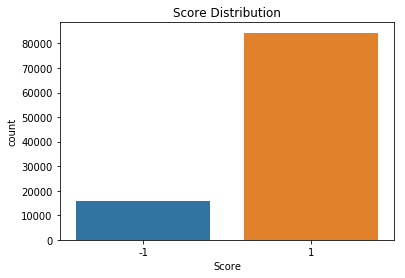

In [58]:
ax = plt.axes()
sns.countplot(final.Score,ax=ax)
ax.set_title('Score Distribution')
plt.show()



In [59]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.cross_validation import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score
from sklearn.cross_validation import cross_val_score
from collections import Counter
from sklearn.metrics import accuracy_score
from sklearn import cross_validation
from sklearn import preprocessing
import warnings
warnings.filterwarnings("ignore")

In [60]:
from sklearn.grid_search import GridSearchCV
from sklearn.datasets import *
from sklearn.linear_model import LogisticRegression
import warnings
warnings.filterwarnings("ignore")
from sklearn.metrics import f1_score
from sklearn.metrics import recall_score
from sklearn.metrics import precision_score
import scikitplot as skplt
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report
from sklearn.model_selection import RandomizedSearchCV

In [61]:
from sklearn.model_selection import GridSearchCV
from sklearn.tree import DecisionTreeClassifier
from scipy.stats import randint as sp_randint
import math

In [62]:
from sklearn.metrics import roc_auc_score
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import cross_val_score
from sklearn.externals import joblib

# BoW:

In [63]:
#BoW

X_train, X_test, Y_train, Y_test = cross_validation.train_test_split(X, Y, test_size=0.3, random_state=0)

count_vect = CountVectorizer() #in scikit-learn
X_train_bow = count_vect.fit_transform(X_train) #
X_test_bow = count_vect.transform(X_test)#


In [64]:
from sklearn import preprocessing

X_train_bow = preprocessing.normalize(X_train_bow)
print(X_train_bow.shape)

(70000, 73447)


In [65]:
from sklearn import preprocessing

X_test_bow = preprocessing.normalize(X_test_bow)


In [66]:
from sklearn.model_selection import TimeSeriesSplit
tscv = TimeSeriesSplit(n_splits = 3)

In [67]:
from sklearn.model_selection import  cross_val_score

In [68]:
from sklearn.model_selection import TimeSeriesSplit
from sklearn.model_selection import GridSearchCV
from sklearn.tree import DecisionTreeClassifier
from scipy.stats import randint as sp_randint

In [229]:
%%time


grid = sp_randint(2,50)
clf = DecisionTreeClassifier(class_weight = 'balanced')
param_grid = {'max_depth':sorted(grid.rvs(50)),
             'min_samples_split': sorted(grid.rvs(50))} #params we need to try on classifier

model = GridSearchCV(clf,param_grid,cv=tscv,scoring='f1', n_jobs = -1)
model.fit(X_train_bow,Y_train)
print("Best HyperParameter: ",model.best_params_)
print("best est :",model.best_estimator_)
print("Best Accuracy: %.2f%%"%(model.best_score_*100))

Best HyperParameter:  {'max_depth': 49, 'min_samples_split': 2}
best est : DecisionTreeClassifier(class_weight='balanced', criterion='gini',
            max_depth=49, max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best')
Best Accuracy: 88.50%
CPU times: user 6min 31s, sys: 9.56 s, total: 6min 40s
Wall time: 6h 53min 52s


In [69]:
def plot_f1_hyper(model):

    x=[]
    y=[]
    for a in model.grid_scores_:
        x.append(a[0]['max_depth']) 
        y.append(a[1])
    plt.xlim(2,50)
    plt.ylim(0,1)
    plt.xlabel("max depth",fontsize=15)
    plt.ylabel("f1-score")
    plt.title('F1 Score v/s Max Depth')
    plt.plot(x,y)
    plt.show()

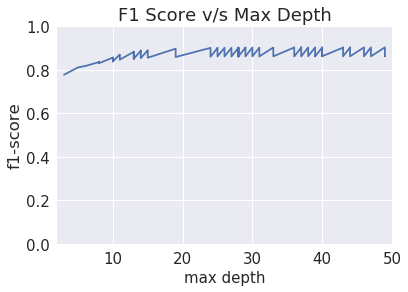

In [51]:
plot_f1_hyper(model)

Confusion Matrix of test set:
 [ [TN  FP]
 [FN TP] ]

Accuracy on test set: 83.197%
F1-Score on test set: 0.844
Precision on test set: 0.868
Recall on test set: 0.832
Error : 16.803%
TPR is 0.8529049680314523
TNR is 0.7225565470014526
FPR is 0.2774434529985474
FNR is 0.1470950319685477
CPU times: user 26.6 s, sys: 37.4 ms, total: 26.7 s
Wall time: 26.4 s


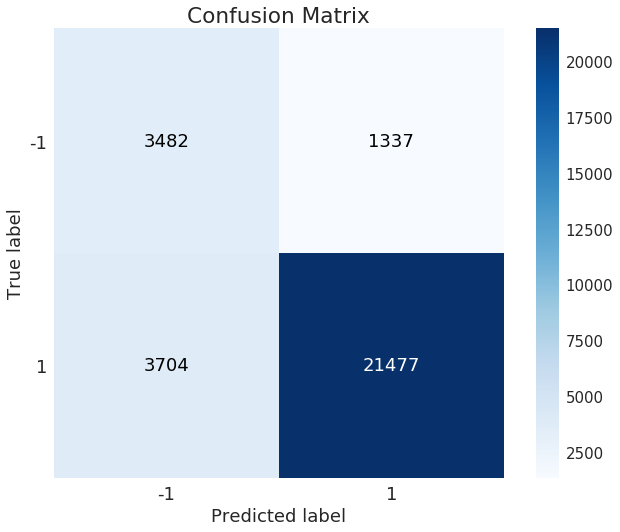

In [232]:
%%time
clf = DecisionTreeClassifier(splitter = 'best', max_depth= 49, class_weight = 'balanced')
A = clf.fit(X_train_bow, Y_train);
Y_pred = clf.predict(X_test_bow)
sns.set(font_scale=1.5)
skplt.metrics.plot_confusion_matrix(Y_test,Y_pred)
print("Confusion Matrix of test set:\n [ [TN  FP]\n [FN TP] ]\n")

print("Accuracy on test set: %0.3f%%"%(accuracy_score(Y_test, Y_pred)*100)) 
print("F1-Score on test set: %0.3f"%(f1_score(Y_test, Y_pred, average='weighted')))
print("Precision on test set: %0.3f"%(precision_score(Y_test, Y_pred, average = 'weighted')))
print("Recall on test set: %0.3f"%(recall_score(Y_test, Y_pred, average = 'weighted')))
print("Error : %0.3f%%"%(100-(accuracy_score(Y_test, Y_pred)*100)))


CM = confusion_matrix(Y_test ,Y_pred)
TN = CM[0][0]
FN = CM[1][0]
TP = CM[1][1]
FP = CM[0][1]
# true positive rate
TPR = TP/(TP+FN)
# Specificity or true negative rate
TNR = TN/(TN+FP) 
# Fall out or false positive rate`
FPR = FP/(FP+TN)
# False negative rate
FNR = FN/(TP+FN)


print("TPR is", TPR)
print("TNR is", TNR)
print("FPR is", FPR)
print("FNR is", FNR)

In [91]:
from sklearn.tree.export import export_graphviz
from io import StringIO

In [92]:
from sklearn.externals.six import StringIO  
from IPython.display import Image  
from sklearn.tree import export_graphviz
import pydotplus

In [235]:
dot_data = StringIO()

export_graphviz(clf, out_file=dot_data,feature_names = all_feat, label = 'root',
                node_ids  = True, filled=True, rounded=True,
                special_characters=True)

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
c = Image(graph.create_png())
c


dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.429647 to fit



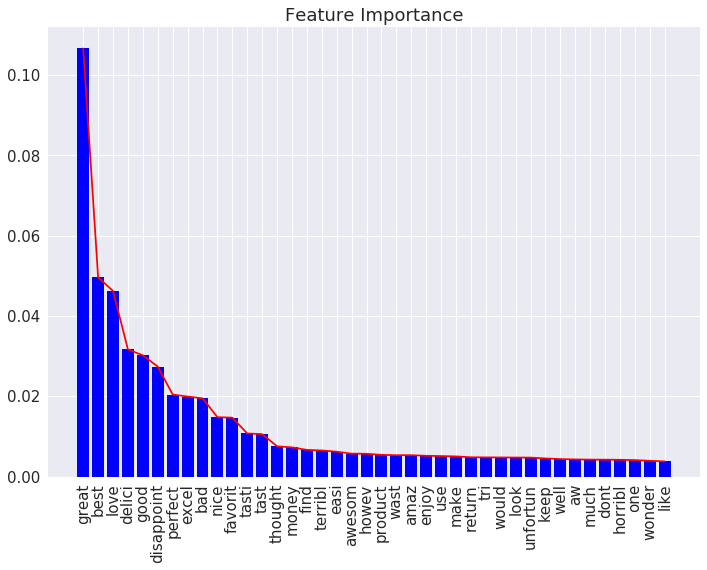

In [236]:

feat =  clf.feature_importances_
# Sort feature feat in descending order
feat_slice = np.argsort(feat)[::-1][:40]

all_feat = count_vect.get_feature_names()


# Create plot
plt.figure()

# Create plot title
plt.title("Feature Importance")

# Add bars
plt.bar(range(40), feat[feat_slice], color = 'blue')
plt.plot(range(40), feat[feat_slice], color = 'red')
# Add feature all_feat as x-axis labels
all_feat = np.array(all_feat)
plt.xticks(range(40), all_feat[feat_slice], rotation=90)

# Show plot
plt.show()



In [237]:
b = all_feat[feat_slice]

In [241]:
b = pd.DataFrame(b)
b.head(20)

,0
0,great
1,best
2,love
3,delici
4,good
5,disappoint
6,perfect
7,excel
8,bad
9,nice


In [246]:
os.getcwd()

'/home/a4ankan/aMAZON fINAL WORK/amazon fine food'

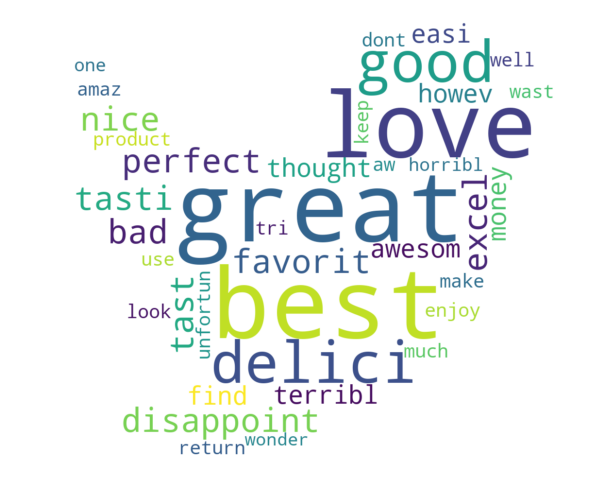

In [261]:
from wordcloud import WordCloud, STOPWORDS
from PIL import Image



all_feat = count_vect.get_feature_names()
my_mask = np.array(Image.open('tweet.png'))
wc = WordCloud(background_color="white", mask = my_mask)
wc.generate(str(b))
plt.imshow(wc, interpolation='bilinear')
plt.axis("off")
plt.show()


In [102]:
from prettytable import PrettyTable

x = PrettyTable()


x.field_names = ["S.R.","Vectorizer","Algorithm", "max_depth",'min_samples_split','Accuracy-> Train','Accuracy-> Test', "F-1 score"]

x.add_row(["(1)","BoW", "Decision Tree", 49, 2, '88.50%', '83.187%', 0.844])




print(x.get_string(title = "<<----------------------DECISION TREE CLASSIFIER---------------------->>"))

+--------------------------------------------------------------------------------------------------------------------+
|                      <<----------------------DECISION TREE CLASSIFIER---------------------->>                      |
+------+------------+---------------+-----------+-------------------+------------------+-----------------+-----------+
| S.R. | Vectorizer |   Algorithm   | max_depth | min_samples_split | Accuracy-> Train | Accuracy-> Test | F-1 score |
+------+------------+---------------+-----------+-------------------+------------------+-----------------+-----------+
| (1)  |    BoW     | Decision Tree |     49    |         2         |      88.50%      |     83.187%     |   0.844   |
+------+------------+---------------+-----------+-------------------+------------------+-----------------+-----------+


As it took almost 7 hours to train my bag of words model, that too with 75k features, so I am reducing the no. of features here because the no. of features here are around 10 lakhs..
-------------------

# Tf-Idf:
--------

In [268]:
tf_idf_vect = TfidfVectorizer(ngram_range=(1,2), max_features = 25000)
X_train_tf = tf_idf_vect.fit_transform(X_train)

X_test_tf = tf_idf_vect.transform(X_test)

In [269]:
from sklearn import preprocessing

X_train_tf = preprocessing.normalize(X_train_tf)
print(X_train_tf.shape)

(70000, 25000)


In [270]:
X_test_tf = preprocessing.normalize(X_test_tf)
print(X_test_tf.shape)

(30000, 25000)


In [271]:
grid = sp_randint(2,50)
clf = DecisionTreeClassifier(class_weight = 'balanced')
param_grid = {'max_depth':sorted(grid.rvs(50)),
             'min_samples_split': sorted(grid.rvs(50))} #params we need to try on classifier

model = GridSearchCV(clf,param_grid,cv=tscv,scoring='f1', n_jobs = -1)
model.fit(X_train_tf,Y_train)
print("Best HyperParameter: ",model.best_params_)
print("best est :",model.best_estimator_)
print("Best Accuracy: %.2f%%"%(model.best_score_*100))

Best HyperParameter:  {'max_depth': 49, 'min_samples_split': 3}
best est : DecisionTreeClassifier(class_weight='balanced', criterion='gini',
            max_depth=49, max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=3,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best')
Best Accuracy: 88.68%


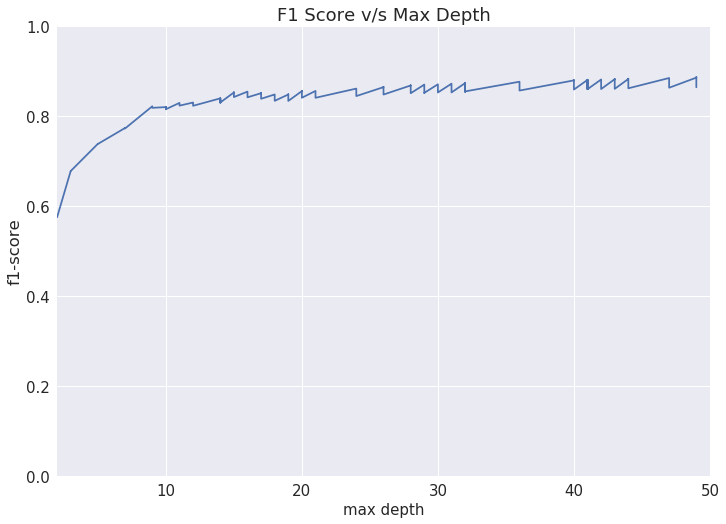

In [272]:
plot_f1_hyper(model)

Confusion Matrix of test set:
 [ [TN  FP]
 [FN TP] ]

Accuracy on test set: 83.367%
F1-Score on test set: 0.846
Precision on test set: 0.871
Recall on test set: 0.834
Error : 16.633%
TPR is 0.8523887057702236
TNR is 0.7358373106453621
FPR is 0.2641626893546379
FNR is 0.14761129422977642
CPU times: user 30.3 s, sys: 35.1 ms, total: 30.3 s
Wall time: 31.3 s


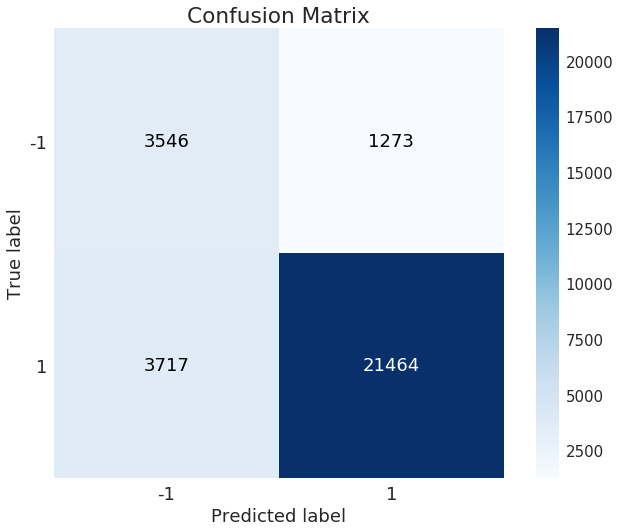

In [273]:
%%time
clf = DecisionTreeClassifier(splitter = 'best', max_depth=  49, min_samples_split = 3, class_weight = 'balanced')
A = clf.fit(X_train_tf, Y_train);
Y_pred = clf.predict(X_test_tf)
sns.set(font_scale=1.5)
skplt.metrics.plot_confusion_matrix(Y_test,Y_pred)
print("Confusion Matrix of test set:\n [ [TN  FP]\n [FN TP] ]\n")

print("Accuracy on test set: %0.3f%%"%(accuracy_score(Y_test, Y_pred)*100)) 
print("F1-Score on test set: %0.3f"%(f1_score(Y_test, Y_pred, average='weighted')))
print("Precision on test set: %0.3f"%(precision_score(Y_test, Y_pred, average = 'weighted')))
print("Recall on test set: %0.3f"%(recall_score(Y_test, Y_pred, average = 'weighted')))
print("Error : %0.3f%%"%(100-(accuracy_score(Y_test, Y_pred)*100)))


CM = confusion_matrix(Y_test ,Y_pred)
TN = CM[0][0]
FN = CM[1][0]
TP = CM[1][1]
FP = CM[0][1]
# true positive rate
TPR = TP/(TP+FN)
# Specificity or true negative rate
TNR = TN/(TN+FP) 
# Fall out or false positive rate
FPR = FP/(FP+TN)
# False negative rate
FNR = FN/(TP+FN)


print("TPR is", TPR)
print("TNR is", TNR)
print("FPR is", FPR)
print("FNR is", FNR)

In [282]:
all_features = tf_idf_vect.get_feature_names()
print("some sample features(unique words in the corpus)",features[0:40])

some sample features(unique words in the corpus) ['abandon', 'abil', 'abl', 'abl buy', 'abl drink', 'abl eat', 'abl enjoy', 'abl find', 'abl get', 'abl give', 'abl keep', 'abl make', 'abl order', 'abl purchas', 'abl tell', 'abl tri', 'abl use', 'abroad', 'absenc', 'absent', 'absolut', 'absolut amaz', 'absolut best', 'absolut delici', 'absolut delight', 'absolut fabul', 'absolut fantast', 'absolut favorit', 'absolut great', 'absolut horribl', 'absolut love', 'absolut noth', 'absolut perfect', 'absolut wonder', 'absolutley', 'absorb', 'absorb flavor', 'absurd', 'abund', 'abus']


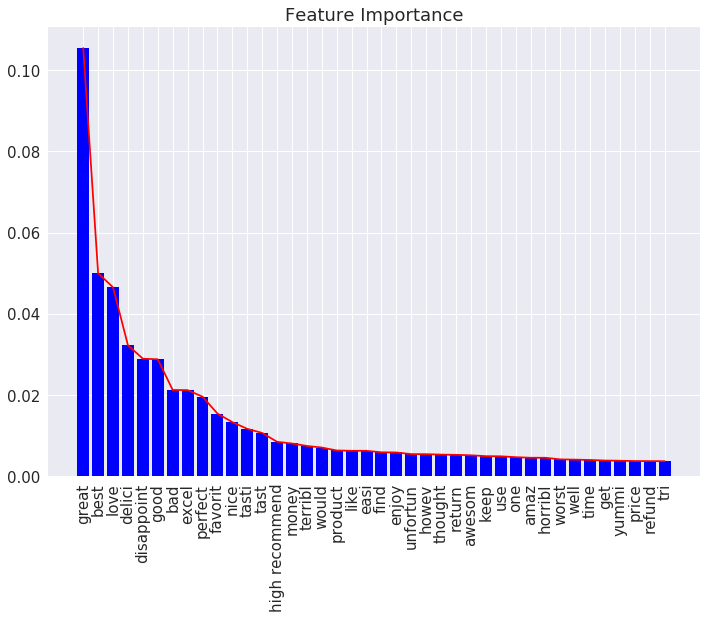

In [293]:
feat =  clf.feature_importances_


# Sort feature feat in descending order
feat_slice = np.argsort(feat)[::-1][:40]



# Create plot
plt.figure()

# Create plot title
plt.title("Feature Importance")

# Add bars
plt.bar(range(40), feat[feat_slice], color = 'blue')
plt.plot(range(40), feat[feat_slice], color = 'red')
# Add feature all_features as x-axis labels
all_features = np.array(all_features)
plt.xticks(range(40), all_features[feat_slice], rotation=90)

# Show plot
plt.show()



In [295]:
c = all_features[feat_slice]
c = pd.DataFrame(c)
c.head()

,0
0,great
1,best
2,love
3,delici
4,disappoint


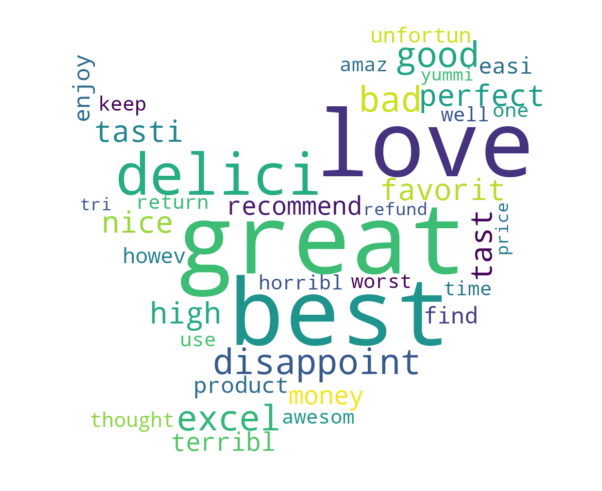

In [302]:
from wordcloud import WordCloud, STOPWORDS
from PIL import Image


my_mask = np.array(Image.open('tweet.png'))
wc = WordCloud(background_color="white", mask = my_mask)
wc.generate(str(c))
plt.imshow(wc, interpolation='bilinear')
plt.axis("off")
plt.show()
